# Taller 2


Santiago Martínez Novoa - 202112020

David Alejandro Fuquen Florez - 202021113

## 0. Importación de librerías

In [2]:
! pip install shap seaborn xgboost

In [3]:
# Data manipulation and analysis
import numpy as np
import pandas as pd

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns

# Statistics
import scipy.stats as stats
from scipy.stats import ks_2samp, chi2_contingency

# Machine Learning
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
from sklearn.model_selection import train_test_split, GridSearchCV, StratifiedKFold
from sklearn.preprocessing import PolynomialFeatures, StandardScaler

# Model Interpretability
import shap
import lime
import lime.lime_tabular

import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
from sklearn.feature_selection import SelectKBest, f_regression, RFE
import warnings
warnings.filterwarnings("ignore")

c:\Users\fuque\Desktop\Uniandes-Ciencia-Datos-Taller2\.venv\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


## 1. Entendimiento y preparación de los datos

### 1.1. Exploración y descripción de los datos

En una primera fase de la exploración de los datos, es necesario revisar las características básicas del dataset, tales como el número de filas y columnas, los tipos de datos presentes en cada columna, la presencia de valores nulos o faltantes, y las estadísticas descriptivas de las variables numéricas. Esto permite obtener una visión general del conjunto de datos y dirigir las decisiones de limpieza y preprocesamiento.

In [4]:
df = pd.read_csv('data/apartamentos.csv')
df.head()

,_id,codigo,tipo_propiedad,tipo_operacion,precio_venta,area,habitaciones,banos,administracion,parqueaderos,...,vigilancia,coords_modified,localidad,barrio,estacion_tm_cercana,distancia_estacion_tm_m,is_cerca_estacion_tm,parque_cercano,distancia_parque_m,is_cerca_parque
0,66d86c7eceda690e85508760,4133491,APARTAMENTO,VENTA,339000000.0,76.0,3.0,2.0,300000.0,1.0,...,0.0,False,SUBA,URB. PICADELLY,Toberin - Foundever,1142.45,0,PARQUE VECINAL DESARROLLO CANTALEJO URBANIZACI...,426.09,1
1,66d86c7eceda690e85508761,3889852,APARTAMENTO,VENTA,223000000.0,63.0,3.0,2.0,NaN,0.0,...,0.0,False,USAQUEN,BARRANCAS PERLAS DEL NORTE,Mazurén,2384.89,0,PARQUE ZONAL ALTA BLANCA,472.47,1
2,66d86c7eceda690e85508762,4386770,APARTAMENTO,VENTA,440898168.0,54.0,3.0,2.0,305000.0,0.0,...,0.0,False,LOS MARTIRES,SAN VICTORINO,De La Sabana,232.22,1,PARQUE METROPOLITANO TERCER MILENIO,961.29,0
3,66d86c7eceda690e85508763,4210060,APARTAMENTO,VENTA,158000000.0,43.0,2.0,2.0,106600.0,0.0,...,0.0,False,SUBA,LA ESTRELLA II,Portal Suba,2275.08,0,PARQUE ZONAL LA GAITANA,539.98,0
4,66d86c7eceda690e85508764,4063762,APARTAMENTO,VENTA,222800000.0,48.0,3.0,2.0,151000.0,0.0,...,0.0,False,USAQUEN,HORIZONTES USAQUEN,Terminal,2099.16,0,PARQUE VECINAL DESARROLLO VERBENAL I,1661.14,0


In [5]:
print("El dataset tiene {} filas y {} columnas.".format(df.shape[0], df.shape[1]))

El dataset tiene 43013 filas y 46 columnas.


In [6]:
# Información básica del dataset
print('Dimensiones del dataset (filas, columnas):', df.shape)
print('\nTipos de datos:')
print(df.dtypes)

Dimensiones del dataset (filas, columnas): (43013, 46)

Tipos de datos:
_id                         object
codigo                      object
tipo_propiedad              object
tipo_operacion              object
precio_venta               float64
area                       float64
habitaciones               float64
banos                      float64
administracion             float64
parqueaderos               float64
sector                      object
estrato                    float64
antiguedad                  object
latitud                    float64
longitud                   float64
direccion                   object
descripcion                 object
website                     object
last_view                   object
datetime                    object
url                         object
timeline                    object
estado                      object
compañia                    object
precio_arriendo            float64
jacuzzi                    float64
piso              

In [7]:

print('\nValores nulos por columna (Porcentaje):')
print((df.isnull().mean() * 100).round(2).sort_values(ascending=False))


Valores nulos por columna (Porcentaje):
closets                    100.00
piso                       100.00
url                         98.15
direccion                   98.15
precio_arriendo             63.20
precio_venta                35.87
timeline                    31.59
administracion              18.42
compañia                    10.53
sector                       3.82
estado                       1.85
barrio                       0.45
antiguedad                   0.02
codigo                       0.00
latitud                      0.00
estrato                      0.00
banos                        0.00
parqueaderos                 0.00
habitaciones                 0.00
tipo_propiedad               0.00
tipo_operacion               0.00
area                         0.00
_id                          0.00
last_view                    0.00
descripcion                  0.00
datetime                     0.00
longitud                     0.00
jacuzzi                      0.00
chimene

Aquí se puede observar que el dataset cuenta con varias columnas con una cantidad significativa de valores nulos, especialmente las columnas `closets`,`piso`,`url`,`direccion`.

In [8]:
print('\nEstadísticas descriptivas:')
print(df.describe())


Estadísticas descriptivas:
       precio_venta          area  habitaciones         banos  administracion  \
count  2.758400e+04  4.301300e+04  43012.000000  43012.000000    3.508800e+04   
mean   2.364794e+09  1.800341e+02      2.615340      2.701339    4.059551e+06   
std    5.574198e+10  9.163002e+03      0.850046      1.196659    6.781642e+07   
min    1.000000e+06  0.000000e+00      1.000000      0.000000    1.000000e+00   
25%    4.029000e+08  6.300000e+01      2.000000      2.000000    3.490000e+05   
50%    7.000000e+08  1.000000e+02      3.000000      3.000000    6.500000e+05   
75%    1.330000e+09  1.740000e+02      3.000000      4.000000    1.200000e+06   
max    4.250000e+12  1.900000e+06      7.000000      6.000000    3.500000e+09   

       parqueaderos       estrato       latitud      longitud  \
count  43012.000000  43012.000000  43013.000000  43013.000000   
mean       1.662862      4.844648      4.686099    -74.062808   
std        1.114685      1.236190      0.038297

Tras esta revisión de los valores y la distribución de los datos de las columnas numéricas, es posible identificar que existen algunas columnas que si bien son numéricas, son de caracter booleano, como ascensor, parqueadero, etc.

In [9]:
numerical_cols = df.select_dtypes(include=['int64', 'float64']).columns
categorical_cols = df.select_dtypes(include=['object', 'category']).columns
boolean_like_cols = [
    col for col in numerical_cols
    if set(df[col].dropna().unique()).issubset({0, 1})
]

# Columnas numéricas reales (no binarias)
real_numerical_cols = [col for col in numerical_cols if col not in boolean_like_cols]

print('Columnas numéricas:', numerical_cols.tolist())
print('Columnas categóricas:', categorical_cols.tolist())
print('Columnas booleanas:', boolean_like_cols)
print('Columnas numéricas reales:', real_numerical_cols)

Columnas numéricas: ['precio_venta', 'area', 'habitaciones', 'banos', 'administracion', 'parqueaderos', 'estrato', 'latitud', 'longitud', 'precio_arriendo', 'jacuzzi', 'piso', 'closets', 'chimenea', 'permite_mascotas', 'gimnasio', 'ascensor', 'conjunto_cerrado', 'piscina', 'salon_comunal', 'terraza', 'vigilancia', 'distancia_estacion_tm_m', 'is_cerca_estacion_tm', 'distancia_parque_m', 'is_cerca_parque']
Columnas categóricas: ['_id', 'codigo', 'tipo_propiedad', 'tipo_operacion', 'sector', 'antiguedad', 'direccion', 'descripcion', 'website', 'last_view', 'datetime', 'url', 'timeline', 'estado', 'compañia', 'localidad', 'barrio', 'estacion_tm_cercana', 'parque_cercano']
Columnas booleanas: ['jacuzzi', 'piso', 'closets', 'chimenea', 'permite_mascotas', 'gimnasio', 'ascensor', 'conjunto_cerrado', 'piscina', 'salon_comunal', 'terraza', 'vigilancia', 'is_cerca_estacion_tm', 'is_cerca_parque']
Columnas numéricas reales: ['precio_venta', 'area', 'habitaciones', 'banos', 'administracion', 'parq

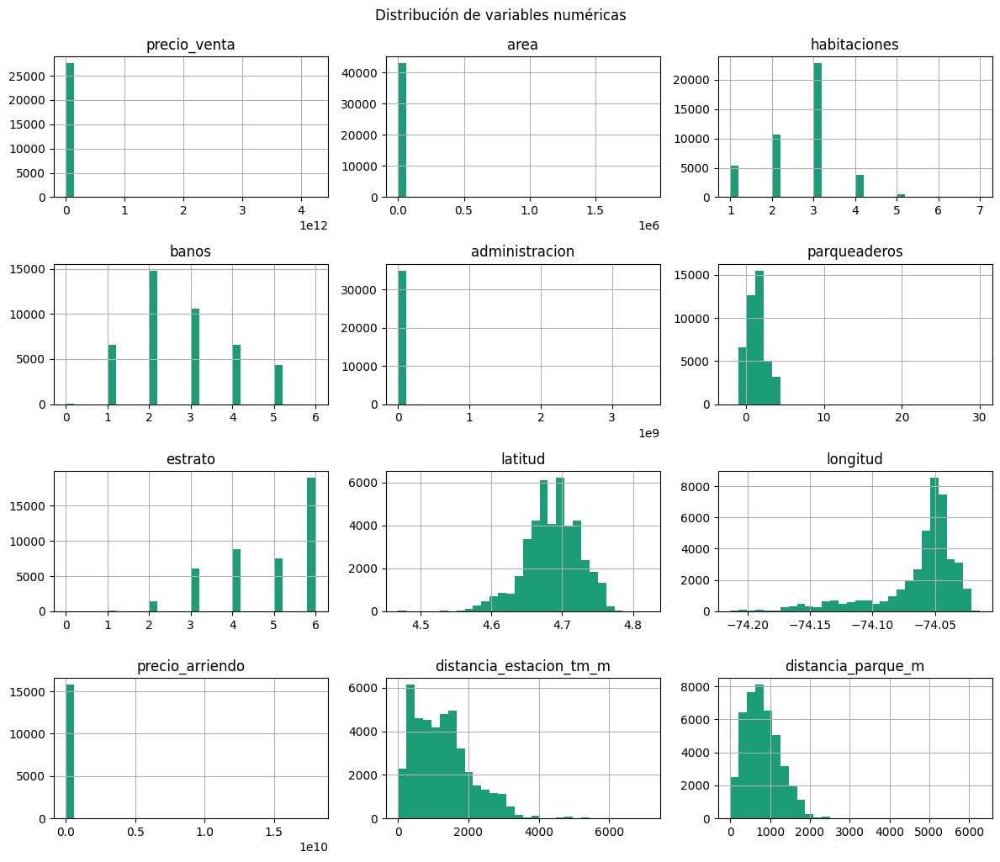

In [10]:
df[real_numerical_cols].hist(bins=30, figsize=(12,10), color='#1b9e77')
plt.tight_layout()
plt.suptitle('Distribución de variables numéricas', y=1.02)
plt.show()

Luego de ver la distribución de los datos, es posible identificar que algunas columnas  parecen presentar outliers, pues la distribución de los datos es muy asimétrica (eg. precio_venta, area, precio_arriendo).

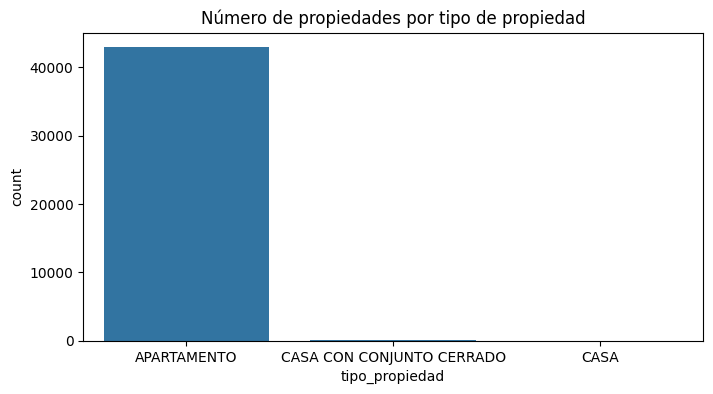

In [11]:
plt.figure(figsize=(8,4))
sns.countplot(x='tipo_propiedad', data=df)
plt.title('Número de propiedades por tipo de propiedad')
plt.show()


La gráfica muestra que la columna `tipo_propiedad` tiene unas categorías altamente desbalanceadas, con una mayoría de registros correspondientes a "apartamento" mientras que las otras categorías tienen una representación mucho menor. Esta columna no aporta información relevante para el análisis.

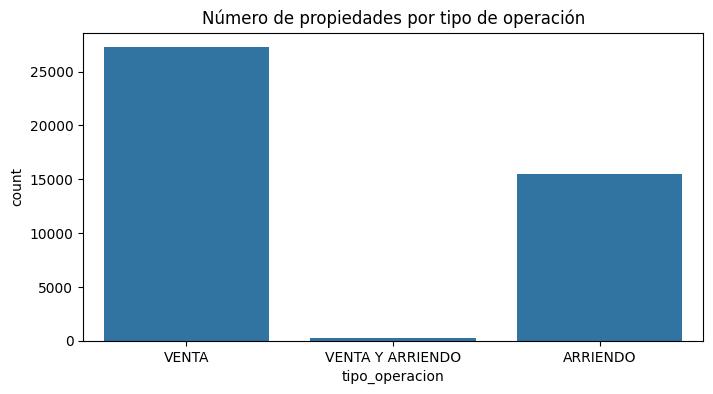

In [12]:
plt.figure(figsize=(8,4))
sns.countplot(x='tipo_operacion', data=df)
plt.title('Número de propiedades por tipo de operación')
plt.show()


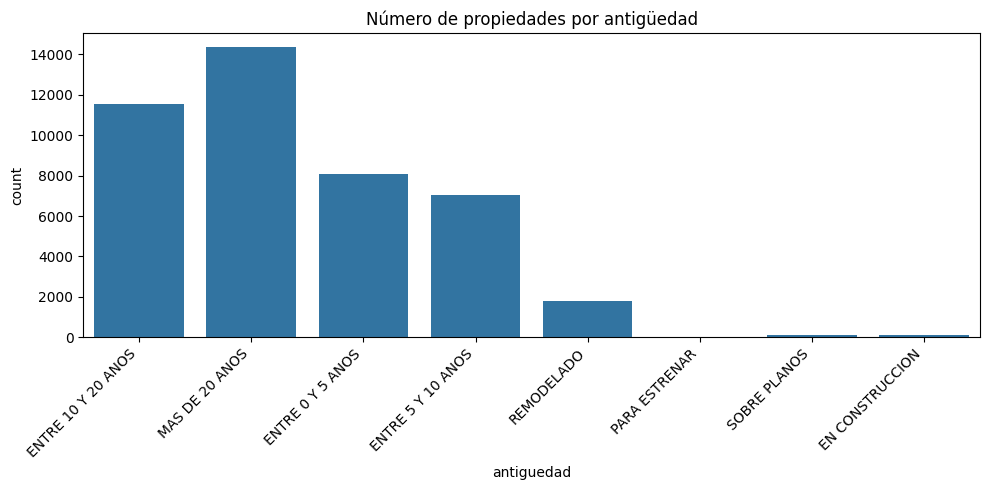

In [13]:
plt.figure(figsize=(10,5))
sns.countplot(x='antiguedad', data=df)
plt.title('Número de propiedades por antigüedad')
plt.xticks(rotation=45, ha='right')  # Rotate labels 45 degrees
plt.tight_layout()  # Adjust layout to prevent label cutoff
plt.show()


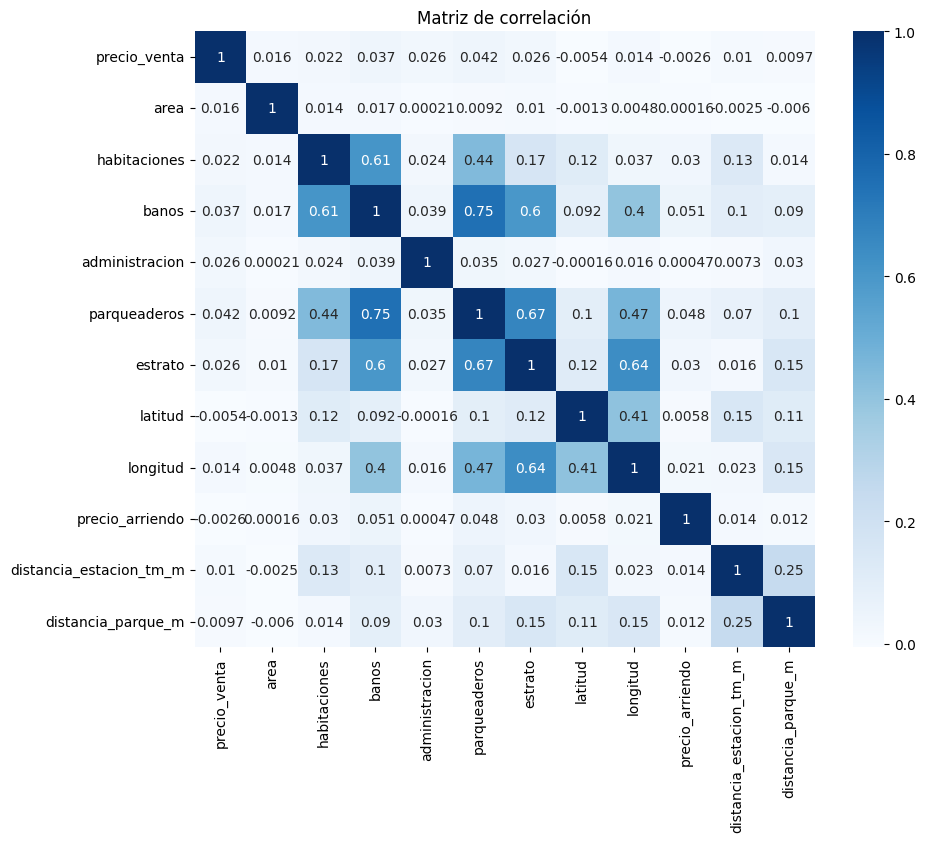

In [14]:
correlation = df[real_numerical_cols].corr()
plt.figure(figsize=(10,8))
sns.heatmap(correlation, annot=True, cmap='Blues')
plt.title('Matriz de correlación')
plt.show()

La matriz de correlación muestra relaciones fuertes entre algunas características estructurales de los inmuebles, destacándose la alta asociación entre habitaciones y baños, y entre baños y parqueaderos, lo que indica que estas variables tienden a aumentar juntas en las propiedades analizadas. También se observa una correlación relevante entre estrato y longitud, reflejando un patrón geográfico en la ubicación de los estratos. En contraste, el precio de venta presenta correlaciones bajas con la mayoría de variables.


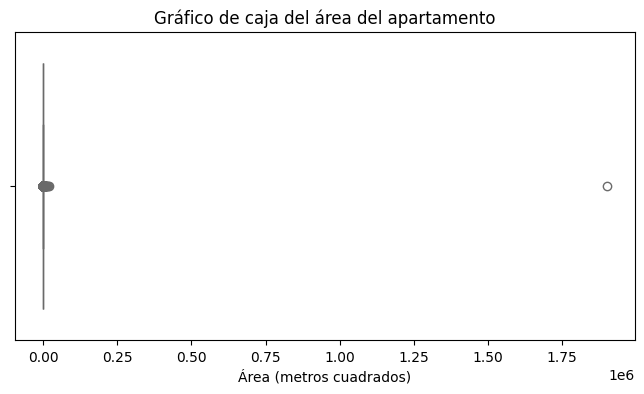

In [15]:
# Boxplot del área quemada para identificar valores atípicos
plt.figure(figsize=(8,4))
sns.boxplot(data=df, x='area', color='#ff6f61')
plt.title('Gráfico de caja del área del apartamento')
plt.xlabel('Área (metros cuadrados)')
plt.show()

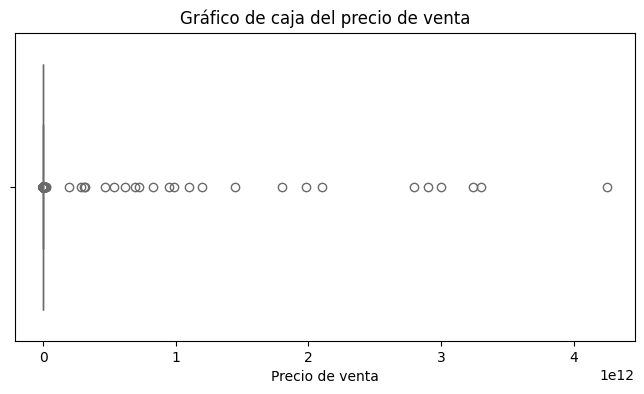

In [16]:
# Boxplot del área quemada para identificar valores atípicos
plt.figure(figsize=(8,4))
sns.boxplot(data=df, x='precio_venta', color='#ff6f61')
plt.title('Gráfico de caja del precio de venta')
plt.xlabel('Precio de venta')
plt.show()

El diagrama de caja evidencia una distribución fuertemente concentrada en valores pequeños de área y la presencia de un outlier extremo cercano a 1.8 millones de metros cuadrados, lo que indica un registro claramente atípico frente al resto de observaciones. La caja y los bigotes se mantienen muy comprimidos cerca del cero, reflejando que la mayoría de los inmuebles tienen áreas similares y sustancialmente más bajas, mientras que el punto aislado sugiere un error de captura o un valor no representativo dentro del conjunto de datos.

### 1.2. Limpieza y procesamiento de los datos

De acuerdo a lo encontrado en la exploraciónd e los datos se tomaron las siguientes decisiones de limpieza y preprocesamiento:

- Se eliminaron las columnas con valores nulos significativos (`closets`,`piso`,`url`,`direccion`).
- Se eliminarán los registros con valores nulos en columnas críticas para el análisis.
- Se hizo un tratamiento de los outliers en las columnas `precio_venta` y `area` usando el método del rango intercuartílico (IQR) para identificar y eliminar valores atípicos.


#### Tratamiento valores nulos

Eliminar columnas con muchos valores nulos. El umbral va a ser del 90% de nulos.

In [17]:
df_cleaned = df.copy()

df_cleaned = df_cleaned.loc[:, df_cleaned.isnull().mean() < 0.9]

print('Dimensiones del dataset después de eliminar columnas con muchos nulos:', df_cleaned.shape)
print('Columnas restantes:', df_cleaned.columns.tolist())
print('Columnas eliminadas:', set(df.columns) - set(df_cleaned.columns))

Dimensiones del dataset después de eliminar columnas con muchos nulos: (43013, 42)
Columnas restantes: ['_id', 'codigo', 'tipo_propiedad', 'tipo_operacion', 'precio_venta', 'area', 'habitaciones', 'banos', 'administracion', 'parqueaderos', 'sector', 'estrato', 'antiguedad', 'latitud', 'longitud', 'descripcion', 'website', 'last_view', 'datetime', 'timeline', 'estado', 'compañia', 'precio_arriendo', 'jacuzzi', 'chimenea', 'permite_mascotas', 'gimnasio', 'ascensor', 'conjunto_cerrado', 'piscina', 'salon_comunal', 'terraza', 'vigilancia', 'coords_modified', 'localidad', 'barrio', 'estacion_tm_cercana', 'distancia_estacion_tm_m', 'is_cerca_estacion_tm', 'parque_cercano', 'distancia_parque_m', 'is_cerca_parque']
Columnas eliminadas: {'piso', 'url', 'closets', 'direccion'}


#### Tratamiento outliers

In [18]:
# 4. Tratamiento de outliers con 'caps' en el precio de venta
lower_cap = df_cleaned['precio_venta'].quantile(0.01)
upper_cap = df_cleaned['precio_venta'].quantile(0.99)
df_cleaned['precio_venta_capped'] = df_cleaned['precio_venta'].clip(lower=lower_cap, upper=upper_cap)

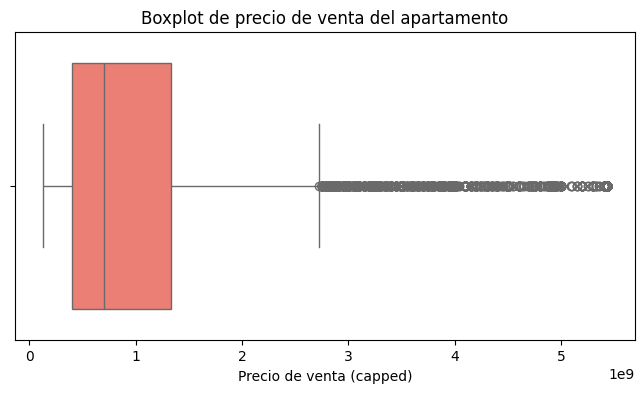

In [19]:
plt.figure(figsize=(8,4))
sns.boxplot(x=df_cleaned['precio_venta_capped'], color='#ff6f61')
plt.title('Boxplot de precio de venta del apartamento')
plt.xlabel('Precio de venta (capped)')
plt.show()

In [20]:
# 4. Tratamiento de outliers con 'caps' en el área
lower_cap = df_cleaned['area'].quantile(0.01)
upper_cap = df_cleaned['area'].quantile(0.99)
df_cleaned['area_capped'] = df_cleaned['area'].clip(lower=lower_cap, upper=upper_cap)

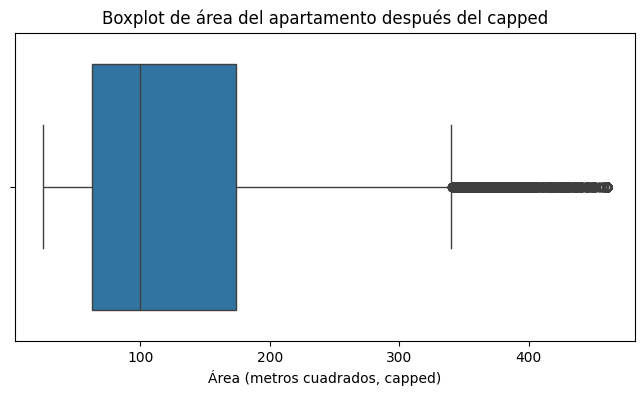

In [21]:
plt.figure(figsize=(8,4))
sns.boxplot(x=df_cleaned['area_capped'])
plt.title('Boxplot de área del apartamento después del capped')
plt.xlabel('Área (metros cuadrados, capped)')
plt.show()

Luego de hacer el tratamiento de los outliers, se observa que la distribución de las columnas `precio_venta` y `area` es más concentrada y menos dispersa, con una reducción significativa en la presencia de valores extremos. 

### 1.3. Ingeniería de características

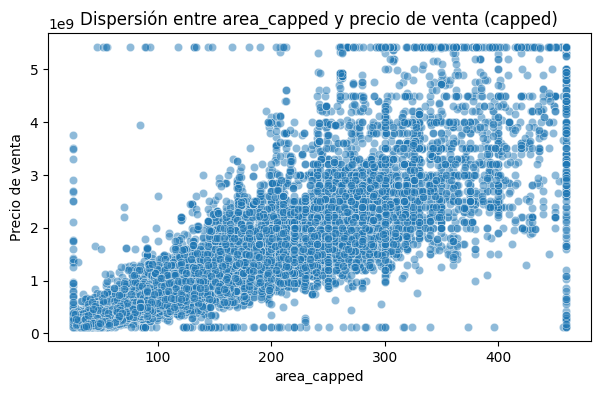

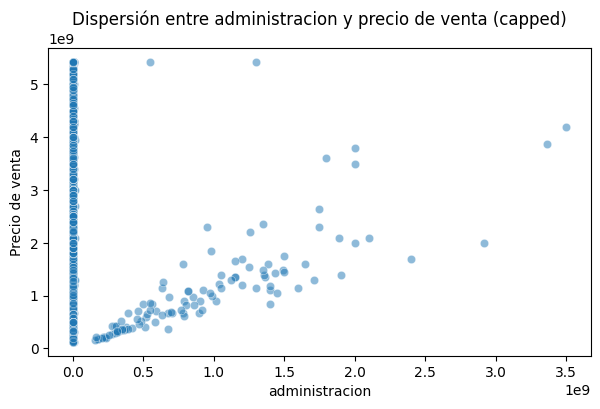

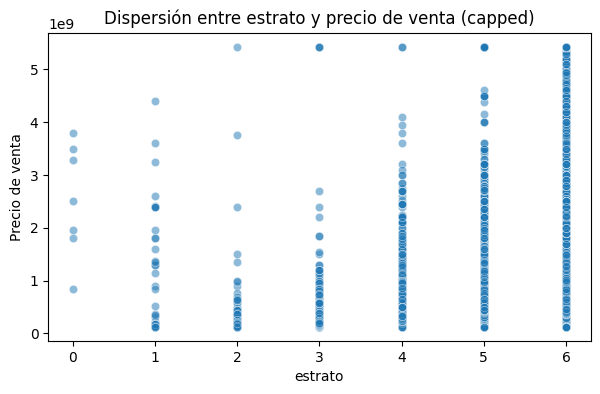

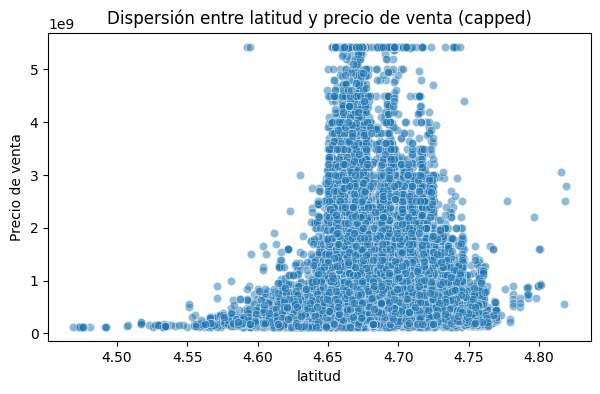

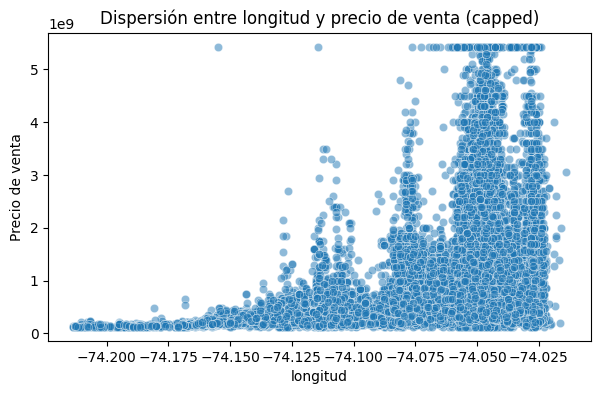

In [22]:
eval_variables = ["area_capped", "administracion", "estrato", "latitud", "longitud"]

for var in eval_variables:
    plt.figure(figsize=(7,4))
    sns.scatterplot(x=var, y='precio_venta_capped', data=df_cleaned, alpha=0.5)
    plt.title(f'Dispersión entre {var} y precio de venta (capped)')
    plt.xlabel(var)
    plt.ylabel('Precio de venta')
    plt.show()

**Decisión importante:**

Luego de realizar los análisis exploratorios y de limpieza de datos, se decidió utilizar las siguientes columnas para el modelo de regresión teniendo en cuenta su relevancia, correlación con la variable objetivo, correlación con otras variables, y la calidad de los datos:

- area_capped
- administracion
- estrato
- latitud
- longitud
- habitaciones
- banos
- parqueaderos

## 2. Entrenamiento del modelo de Machine Learning

Para la correcta evaluación del modelo es necesario guardar un conjunto de datos de validación. Para ello, se separa el 20% de los datos en un conjunto aparte. Los caps se realizan utilizando únicamente los datos de entrenamiento para evitar el data leakage.

In [23]:
def cap_outliers(df, col, caps=None):
    if caps is None:
        p1, p99 = df[col].quantile([0.01, 0.99])
        caps = (p1, p99)
    capped = df[col].clip(lower=caps[0], upper=caps[1])
    return capped, caps

La función de preprocesamiento no solo separa en las tres particiones (train, val, test), sino que también aplica todas las decisiones de preprocesamiento tomadas en la sección anterior, incluyendo el tratamiento de outliers y la imputación de valores nulos.

In [24]:
def prepare_data(df):

    df = df.copy()
    # Eliminar duplicados y filas sin precio_venta
    df = df.drop_duplicates()
    df = df.dropna(subset=['precio_venta'])

    # --- 1. Separar train (0.7), val (0.1), test (0.2) ---
    df_train, df_temp = train_test_split(
        df, test_size=0.3, random_state=42
    )
    df_val, df_test = train_test_split(
        df_temp, test_size=2/3, random_state=42  # 0.2 / 0.3
    )


    # --- 2. Columnas válidas (<90% NA en TRAIN) ---
    valid_columns = df_train.columns[df_train.isnull().mean() < 0.9]
    df_train = df_train[valid_columns]
    df_val   = df_val[valid_columns.intersection(df_val.columns)] #Quitando las columnas cuya cantidad de nulo sea mayor al 90% 
    df_test  = df_test[valid_columns.intersection(df_test.columns)] #Quitando las columnas cuya cantidad de nulo sea mayor al 90%

    # --- 3. Capping en TRAIN y aplicar mismos límites en VAL/TEST ---
    df_train['precio_venta_capped'], caps_precio = cap_outliers(df_train, 'precio_venta')
    df_train['area_capped'], caps_area = cap_outliers(df_train, 'area')

    df_val['precio_venta_capped'], _ = cap_outliers(df_val, 'precio_venta', caps_precio)
    df_val['area_capped'], _ = cap_outliers(df_val, 'area', caps_area)

    df_test['precio_venta_capped'], _ = cap_outliers(df_test, 'precio_venta', caps_precio)
    df_test['area_capped'], _ = cap_outliers(df_test, 'area', caps_area)

    # --- 4. Imputaciones ---
    mean_values = df_train[['latitud', 'longitud', 'administracion', 'estrato', 'area_capped']].mean()

    for col in ['latitud', 'longitud', 'administracion', 'estrato', 'area_capped']:
        df_train[col] = df_train[col].fillna(mean_values[col])
        df_val[col]   = df_val[col].fillna(mean_values[col])
        df_test[col]  = df_test[col].fillna(mean_values[col])

    for col in ['habitaciones', 'banos', 'parqueaderos']:
        df_train[col] = df_train[col].fillna(0)
        df_val[col]   = df_val[col].fillna(0)
        df_test[col]  = df_test[col].fillna(0)

    return df_train, df_val, df_test


Es necesario estandarizar las variables numéricas y realizar el one-hot encoding de las variables categóricas para que el modelo pueda interpretarlas correctamente.

In [25]:
def encode_and_scale(df_train, df_val, df_test, numeric_cols, categorical_cols):

    X_train = df_train[numeric_cols + categorical_cols]
    X_val   = df_val[numeric_cols + categorical_cols]
    X_test  = df_test[numeric_cols + categorical_cols]

    # One-hot con train como referencia
    X_train = pd.get_dummies(X_train, drop_first=True)
    X_val   = pd.get_dummies(X_val, drop_first=True)
    X_test  = pd.get_dummies(X_test, drop_first=True)

    # Alinear columnas
    X_val  = X_val.reindex(columns=X_train.columns, fill_value=0)
    X_test = X_test.reindex(columns=X_train.columns, fill_value=0)

    # Escalamiento solo con train
    scaler = StandardScaler()
    X_train[numeric_cols] = scaler.fit_transform(X_train[numeric_cols])
    X_val[numeric_cols]   = scaler.transform(X_val[numeric_cols])
    X_test[numeric_cols]  = scaler.transform(X_test[numeric_cols])

    return X_train, X_val, X_test


Finalmente, se realizan el entrenamiento y evaluación de 5 modelos de regresión: Regresión Lineal, Random Forest, Decision Tree, K-Nearest Neighbors (KNN) y XGBoost. Cada modelo es entrenado con los datos de entrenamiento y evaluado utilizando el conjunto de validación, reportando métricas clave como R², MAE y RMSE para comparar su desempeño. La idea es identificar cuál modelo ofrece la mejor capacidad predictiva para el problema planteado. Luego de esto se seleccionará el modelo de regresión lineal y el modelo que mejor desempeño tenga en validación para realizar los análisis de selección de características.

In [26]:
from sklearn.linear_model import LinearRegression, BayesianRidge
from sklearn.ensemble import RandomForestRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from xgboost import XGBRegressor

def train_models(X_train, y_train, X_test, y_test):

    models = {
        "LinearRegression": LinearRegression(),
        "RandomForest": RandomForestRegressor(n_estimators=200, random_state=42),
        "DecisionTree": DecisionTreeRegressor(
            max_depth=None,
            min_samples_split=2,
            random_state=42
        ),
        "KNN": KNeighborsRegressor(
            n_neighbors=5,
            weights='distance'
        ),
        "XGBoost": XGBRegressor(
            n_estimators=300,
            learning_rate=0.05,
            max_depth=6,
            subsample=0.8,
            colsample_bytree=0.8,
            random_state=42,
            objective="reg:squarederror"
        )
    }

    results = []
    for name, model in models.items():
        model.fit(X_train, y_train)
        pred = model.predict(X_test)
        results.append({
            "model": name,
            "R2": r2_score(y_test, pred),
            "MAE": mean_absolute_error(y_test, pred),
            "RMSE": mean_squared_error(y_test, pred) ** 0.5
        })

    return pd.DataFrame(results)


Adicionalmente, se implementa una función de selección de características que permite elegir las variables más relevantes para el modelo utilizando el método de K mejores características (KBest) así como recursive feature elimination (RFE) utilizando como modelo base un XGBOOST. La idea es mejorar el rendimiento del modelo al reducir la dimensionalidad y eliminar características irrelevantes o redundantes.

In [27]:

def feature_selection(method, X, y, k=10):

    if method == 'kbest':
        selector = SelectKBest(score_func=f_regression, k=k)
        selector.fit(X, y)
        selected = X.columns[selector.get_support()]

    elif method == 'rfe':
        base_model = XGBRegressor(
            n_estimators=200,
            learning_rate=0.05,
            max_depth=4,
            subsample=0.8,
            colsample_bytree=0.8,
            random_state=42,
            objective="reg:squarederror"
        )
        selector = RFE(estimator=base_model, n_features_to_select=k, step=1)
        selector.fit(X, y)
        selected = X.columns[selector.get_support()]

    else:
        raise ValueError("Método no reconocido")

    return selected


Ahora bien, también es necesario evaluar el desempeño o el impacto de realizar el feature selection en los modelos. Para ello, se entrena y evalúa nuevamente cada modelo utilizando únicamente las características seleccionadas por el método elegido (KBest o RFE). Esto permite comparar el rendimiento de los modelos antes y después de la selección de características.

In [28]:
df_train, df_val, df_test = prepare_data(df)

numeric_cols = ["area_capped", "administracion", "estrato", "latitud", "longitud",
                "habitaciones", "banos", "parqueaderos"]

categorical_cols = ["tipo_propiedad", "antiguedad"]

X_train, X_val, X_test = encode_and_scale(df_train, df_val, df_test, numeric_cols, categorical_cols)

y_train = df_train["precio_venta_capped"]
y_val   = df_val["precio_venta_capped"]
y_test  = df_test["precio_venta_capped"]


# -----------------------------
# 1. Evaluación con TODAS las variables
# -----------------------------
print("Resultados con todas las variables:")

results_all = train_models(
    X_train,
    y_train,
    X_test,
    y_test
)

print(results_all)


# -----------------------------
# 2. Feature Selection
# -----------------------------
selected_features = feature_selection("rfe", X_train, y_train, k=12)
print("Variables seleccionadas:", list(selected_features))


# -----------------------------
# 3. Evaluación con variables seleccionadas
# -----------------------------
print("Resultados con feature selection:")

results_fs = train_models(
    X_train[selected_features],
    y_train,
    X_test[selected_features],
    y_test
)

print(results_fs)


Resultados con todas las variables:
              model        R2           MAE          RMSE
0  LinearRegression  0.782479  2.706966e+08  4.476052e+08
1      RandomForest  0.887945  1.519663e+08  3.212630e+08
2      DecisionTree  0.803186  1.971608e+08  4.257677e+08
3               KNN  0.861895  1.712687e+08  3.566564e+08
4           XGBoost  0.898245  1.562406e+08  3.061421e+08
Variables seleccionadas: ['area_capped', 'administracion', 'estrato', 'latitud', 'longitud', 'habitaciones', 'banos', 'parqueaderos', 'antiguedad_ENTRE 0 Y 5 ANOS', 'antiguedad_ENTRE 5 Y 10 ANOS', 'antiguedad_MAS DE 20 ANOS', 'antiguedad_REMODELADO']
Resultados con feature selection:
              model        R2           MAE          RMSE
0  LinearRegression  0.781869  2.714697e+08  4.482329e+08
1      RandomForest  0.887886  1.520177e+08  3.213468e+08
2      DecisionTree  0.795722  1.986724e+08  4.337661e+08
3               KNN  0.863607  1.713684e+08  3.544388e+08
4           XGBoost  0.897348  1.570036e+

Luego de ver los resultados obtenidos, es claro que la selección de características utilizando RFE con XGBoost como modelo base no ofrece mejoras significativas en el desempeño de los modelos. De hecho, algunos modelos muestran una ligera disminución en sus métricas de evaluación después de aplicar la selección de características. Por lo cual, se utilizarán todas las características originales para el modelo final.

Sin embargo, es claro que el mejor modelo es XGBoost con el mayor R² y el menor MAE y RMSE. Los errores no están estandarizados, con lo cual se puede interpretar que el modelo tiene un error promedio de aproximadamente del orden de 154'263'600 COP.

## 3. Análisis cuantitativo de resultados

In [29]:
y_train.describe()

count    1.930800e+04
mean     1.050890e+09
std      9.943679e+08
min      1.281280e+08
25%      4.029750e+08
50%      7.000000e+08
75%      1.326250e+09
max      5.500000e+09
Name: precio_venta_capped, dtype: float64

In [30]:
results_fs = train_models(
    X_train[selected_features],
    y_train,
    X_val[selected_features],
    y_val
)

results_copy = results_fs.copy()
results_copy['MAE'] = results_fs['MAE'].apply(lambda x: "${:,.0f} COP".format(x))
results_copy['RMSE'] = results_fs['RMSE'].apply(lambda x: "${:,.0f} COP".format(x))
print(results_copy)


              model        R2               MAE              RMSE
0  LinearRegression  0.782483  $278,217,571 COP  $478,571,972 COP
1      RandomForest  0.882107  $155,804,251 COP  $352,326,166 COP
2      DecisionTree  0.804831  $201,823,179 COP  $453,320,469 COP
3               KNN  0.846826  $180,297,678 COP  $401,599,516 COP
4           XGBoost  0.886990  $163,695,032 COP  $344,951,824 COP


Los modelos evaluados muestran diferencias importantes en su capacidad para estimar precios de vivienda. En términos generales, las métricas de R², MAE y RMSE permiten entender qué tan bien se ajusta cada algoritmo al comportamiento real del mercado. El R² indica qué proporción de la variabilidad del precio está siendo explicada por el modelo, mientras que el MAE y el RMSE expresan el error promedio y el impacto de errores grandes, respectivamente, en pesos colombianos. Al revisar los resultados, XGBoost y Random Forest son los modelos que ofrecen las mejores predicciones, alcanzando niveles de ajuste superiores al 0.88 y errores promedio entre 150 y 160 millones COP, lo que representa una mejora significativa frente a los métodos lineales.

Aunque un MAE cercano a 155 millones COP sigue siendo un margen considerable, este error representa aproximadamente el 15% del precio promedio del mercado (1,050 millones COP) y es significativamente inferior a la desviación estándar de los datos (994 millones COP), validando que el modelo captura efectivamente patrones relevantes del mercado inmobiliario. El modelo cumple con el objetivo de HabitAlpes de entregar una estimación inicial razonable del valor de un apartamento, al menos en términos de métricas, es necesario realizar análisis a nivel de negocio.


## 4. Análisis cualitativo de resultados

### 4.1. XGBoost

In [31]:
X_train = X_train.astype(float)
X_test = X_test.astype(float)


PermutationExplainer explainer: 5519it [10:52,  8.42it/s]                          


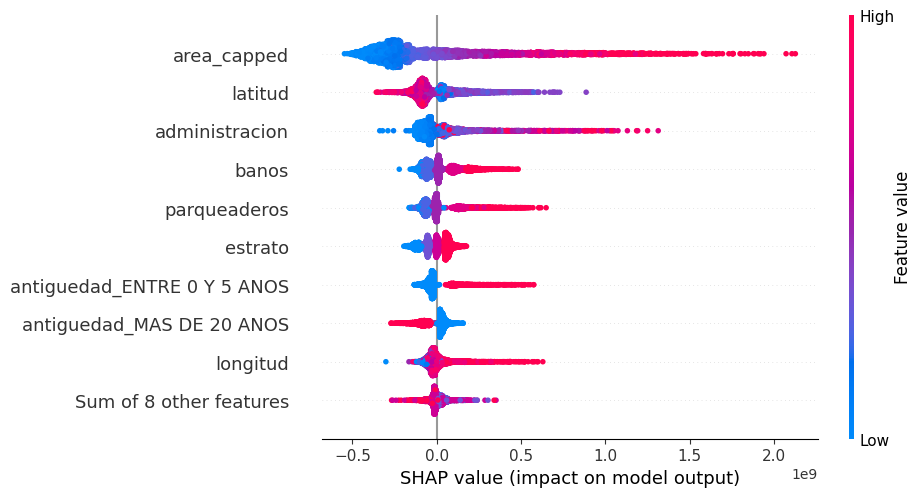

In [32]:
model_xgb = XGBRegressor(
    n_estimators=300,
    learning_rate=0.05,
    max_depth=6,
    subsample=0.8,
    colsample_bytree=0.8,
    objective="reg:squarederror",
    random_state=42
)

model_xgb.fit(X_train, y_train)

# Create masker from the DataFrame (keeps names)
masker = shap.maskers.Independent(X_train)

# Use model.predict (this avoids the TreeExplainer bug)
explainer = shap.Explainer(model_xgb.predict, masker)

# Compute SHAP values
shap_values = explainer(X_test)

# Plot with REAL feature names
shap.plots.beeswarm(shap_values)



### Calculos realizados para conseguir la exactitud promedio del modelo para Generación del Valor

In [47]:
y_pred = model_xgb.predict(X_test)

y_test_list = y_test.to_list()

counter_of_underestimations = 0
counter_of_overestimations = 0
counter_of_acceptable = 0
for i in range(len(y_test_list)):
    if y_test_list[i] - y_pred[i] > 20_000_000:
        counter_of_underestimations += 1
    elif y_pred[i] - y_test_list[i] > 20_000_000:
        counter_of_overestimations += 1
    else:
        counter_of_acceptable += 1

print("Número de subestimaciones mayores a 20 millones COP:", counter_of_underestimations)
print(f"Porcentaje de subestimaciones mayores a 20 millones COP: {counter_of_underestimations / len(y_test_list) * 100:.2f}%")

print("Número de sobreestimaciones mayores a 20 millones COP:", counter_of_overestimations)
print(f"Porcentaje de sobreestimaciones mayores a 20 millones COP: {counter_of_overestimations / len(y_test_list) * 100:.2f}%")

print("Número de predicciones aceptables (diferencia <= 20 millones COP):", counter_of_acceptable)
print(f"Porcentaje de predicciones aceptables (diferencia <= 20 millones COP): {counter_of_acceptable / len(y_test_list) * 100:.2f}%")

print("Número de predicciones aceptables o sobreestimaciones:", counter_of_acceptable + counter_of_overestimations)
print(f"Porcentaje de predicciones aceptables o sobreestimaciones: {((counter_of_acceptable + counter_of_overestimations) / len(y_test_list)) * 100:.2f}%")

print("Número total de predicciones:", len(y_test_list))

Número de subestimaciones mayores a 20 millones COP: 2027
Porcentaje de subestimaciones mayores a 20 millones COP: 36.73%
Número de sobreestimaciones mayores a 20 millones COP: 2438
Porcentaje de sobreestimaciones mayores a 20 millones COP: 44.18%
Número de predicciones aceptables (diferencia <= 20 millones COP): 1053
Porcentaje de predicciones aceptables (diferencia <= 20 millones COP): 19.08%
Número de predicciones aceptables o sobreestimaciones: 3491
Porcentaje de predicciones aceptables o sobreestimaciones: 63.27%
Número total de predicciones: 5518


In [ ]:
# Resumen estadístico de SHAP values

print("="*70)
print("RESUMEN GLOBAL DE SHAP VALUES - XGBoost")
print("="*70)

# Calcular estadísticas por feature
shap_stats = pd.DataFrame({
    'feature': X_test.columns,
    'mean_abs_shap': np.abs(shap_values.values).mean(axis=0),
    'std_shap': shap_values.values.std(axis=0),
    'min_shap': shap_values.values.min(axis=0),
    'max_shap': shap_values.values.max(axis=0)
}).sort_values('mean_abs_shap', ascending=False)

print("\nEstadísticas de contribuciones SHAP (ordenadas por importancia):")
print(f"{'Feature':<30} {'Media |SHAP|':<15} {'Std':<12} {'Min':<15} {'Max':<15}")
print("-" * 90)

for _, row in shap_stats.head(15).iterrows():
    print(f"{row['feature']:<30} {row['mean_abs_shap']:<15,.2f} "
          f"{row['std_shap']:<12,.2f} {row['min_shap']:<15,.2f} {row['max_shap']:<15,.2f}")

# Identificar características con efectos positivos/negativos
print("\n" + "="*70)
print("ANÁLISIS DE DIRECCIÓN DE EFECTOS")
print("="*70)

effects = pd.DataFrame({
    'feature': X_test.columns,
    'mean_shap': shap_values.values.mean(axis=0),
    'positive_pct': (shap_values.values > 0).mean(axis=0) * 100
}).sort_values('mean_shap', ascending=False)

print("\nCaracterísticas con efecto predominantemente POSITIVO:")
positive_features = effects[effects['mean_shap'] > 0].head(5)
for _, row in positive_features.iterrows():
    print(f"  {row['feature']:<30} (promedio: {row['mean_shap']:>10,.2f}, "
          f"positivo en {row['positive_pct']:.1f}% casos)")

print("\nCaracterísticas con efecto predominantemente NEGATIVO:")
negative_features = effects[effects['mean_shap'] < 0].head(5)
for _, row in negative_features.iterrows():
    print(f"  {row['feature']:<30} (promedio: {row['mean_shap']:>10,.2f}, "
          f"negativo en {100-row['positive_pct']:.1f}% casos)")

RESUMEN GLOBAL DE SHAP VALUES - XGBoost

Estadísticas de contribuciones SHAP (ordenadas por importancia):
Feature                        Media |SHAP|    Std          Min             Max            
------------------------------------------------------------------------------------------
area_capped                    337,972,412.66  441,386,985.96 -537,038,830.02 2,139,809,908.51
latitud                        107,929,372.28  138,839,947.71 -361,494,235.22 842,708,272.38 
administracion                 99,860,360.73   162,494,068.76 -338,702,434.20 1,305,227,421.03
banos                          78,104,344.38   102,811,606.08 -220,965,221.93 508,071,495.24 
parqueaderos                   76,728,782.09   117,076,035.19 -169,190,336.85 633,355,684.42 
estrato                        62,967,754.27   73,899,498.71 -195,545,264.44 172,642,520.03 
antiguedad_ENTRE 0 Y 5 ANOS    58,147,221.25   83,475,950.17 -138,577,772.39 590,805,882.14 
antiguedad_MAS DE 20 ANOS      56,139,093.31   67,103

Como podemos ver en los resultados de los SHAP values, hay varios atributos o variables que tienen un impacto elevado y notorio en el resultado del modelo. 

En primer lugar, vemos que el área del apartamento (area_capped) tiene una relación directa y positiva con la predicción del modelo. Es decir, a mayor área, mayor precio de venta estimado. Asimismo, el valor de la cuota de administración del apartamento (administracion) tiene una relación similar a la anterior: entre más cuesta la administración, mayor es el valor estimado. También, vemos que existe una relación inversa entre el valor de la latitud y el valor predicho para el apartamento: entre menor la latitud de la ubicación del apartamento, mayor el costo esperado. Finalmente, como era de esperarse, a mayor cantidad de parqueaderos y baños, mayor será la predicción para el precio predicho del apartamento.

In [ ]:
from lime.lime_tabular import LimeTabularExplainer
import numpy as np
from IPython.display import display, HTML
# Crear el explicador con tus datos de entrenamiento
lime_explainer = LimeTabularExplainer(
    training_data=X_train.to_numpy(),
    feature_names=X_train.columns.tolist(),
    mode='regression'
)

# Observación que quieres explicar
sample_idx = 16

# Explicación usando el modelo deseado
for i in [5, 20, 33]:
    exp = lime_explainer.explain_instance(
        X_test.iloc[i].values,
        model_xgb.predict,
        num_features=10
    )
    display(HTML(exp.as_html()))


In [ ]:
for i in [5, 20, 33]:
    print(f"\n{'='*70}")
    print(f"Explicación LIME - Observación {i}")
    print(f"{'='*70}")
    
    exp = lime_explainer.explain_instance(
        X_test.iloc[i].values,
        model_xgb.predict,
        num_features=10
    )
    
    print(f"\nPredicción: ${exp.predicted_value:,.0f} COP")
    print(f"Valor real: ${y_test.iloc[i]:,.0f} COP")
    print(f"Error: ${abs(exp.predicted_value - y_test.iloc[i]):,.0f} COP")
    
    print("\nTop 10 características más influyentes:")
    print(f"{'Característica':<35} {'Rango':<25} {'Peso':>10}")
    print("-" * 70)
    
    for feature, weight in exp.as_list():
        print(f"{feature:<60} {weight:>10,.2f}")
    
    # Mostrar valores originales de las features
    print("\nValores originales de características principales:")
    feature_names = X_train.columns.tolist()
    for idx, col in enumerate(feature_names[:10]):
        value = X_test.iloc[i, idx]
        print(f"  {col}: {value:.4f}")


Explicación LIME - Observación 5

Predicción: $2,025,426,432 COP
Valor real: $1,600,000,000 COP
Error: $425,426,432 COP

Top 10 características más influyentes:
Característica                      Rango                           Peso
----------------------------------------------------------------------
area_capped <= -0.75                                         -475,390,034.59
parqueaderos > 0.22                                          205,110,461.61
0.14 < banos <= 1.00                                         186,993,602.79
antiguedad_ENTRE 0 Y 5 ANOS <= 0.00                          -170,116,280.99
antiguedad_PARA ESTRENAR <= 0.00                             128,460,848.14
longitud > 0.58                                              109,449,574.90
antiguedad_MAS DE 20 ANOS <= 0.00                            95,505,362.48
0.11 < latitud <= 0.72                                       -86,285,541.55
antiguedad_ENTRE 5 Y 10 ANOS > 0.00                          82,547,468.79
tipo_propi

Utilizando LIME, podemos ver la forma en que las diferentes variables afectan los resultados de algunos casos específicos. En nuestros tres casos particulares, el factor que más impulsa la predicción del modelo es area_capped, el cual tiene de forma consistente un impacto notable cuando el área de la propiedad es pequeña: reduce sustancialmente el valor de la predicción. En la Observación 5, aunque el área pequeña redujo fuertemente la predicción, características como la cantidad de baños y estacionamientos empujaron la estimación considerablmente, resultando en una sobreestimación importante (de más de 400 millones de pesos). En la Observación 20, la mayoría de las características influyentes también tuvieron efectos negativos: área pequeña y  bajo estrato social, pero en este caso se alinearon bien con el valor real, produciendo un error más pequeño (20 millones de pesos). En la Observación 33, el área pequeña nuevamente disminuyó fuertemente el precio predicho, pero influencias positivas como el costo de administración y el tipo de propiedad no fueron lo suficientemente fuertes como para compensarlo, lo que llevó a una subestimación significativa (de 118 millones de pesos).

En las tres explicaciones, el modelo parece estar dando un peso desproporcionado a area_capped, con descuentos tan grandes que dominan otros factores importantes. Otros contribuyentes consistentes incluyen baños, estacionamientos, antigüedad de la propiedad y ubicación geográfica, cuyos efectos en general tienen sentido en el contexto del problema. En conjunto, LIME sugiere que el modelo es lógico, pero podría estar penalizando en exceso las propiedades pequeñas. Más aún, analizando los casos particulares, evidenciamos un error más alto del deseado, de hasta cientos de millones de pesos. 

### 4.2. Regresión Lineal

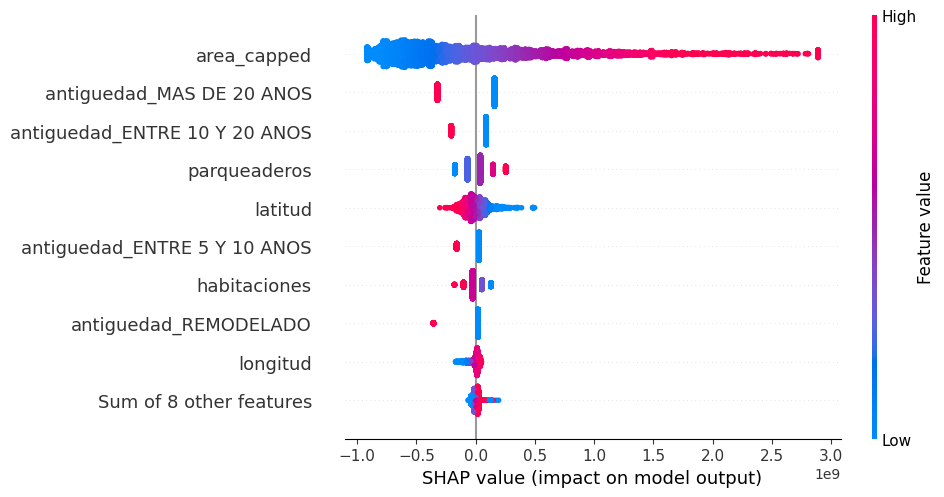

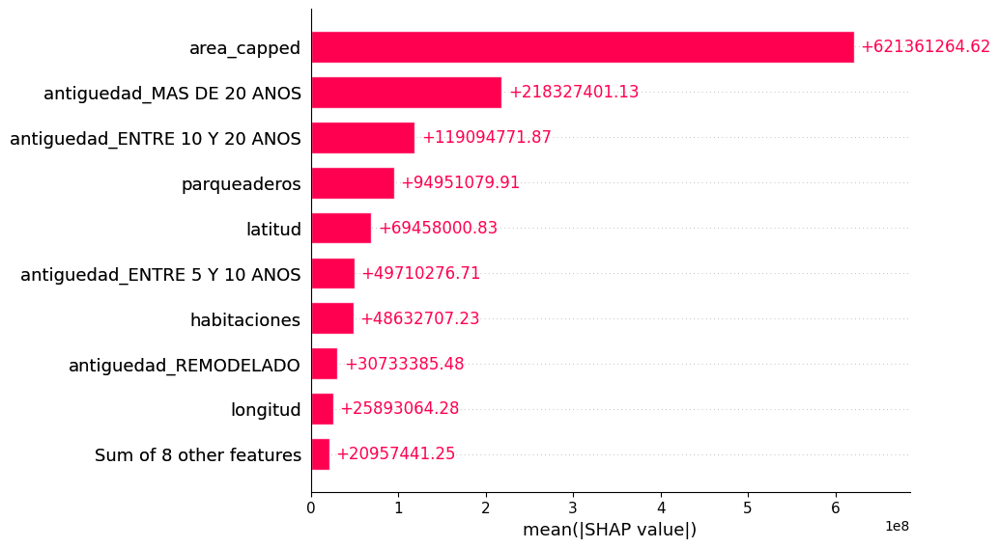

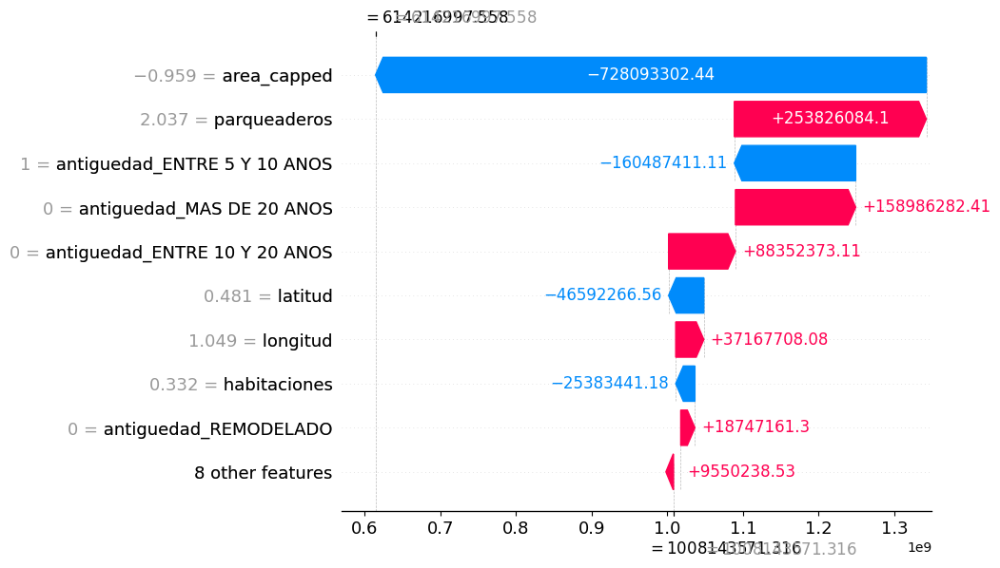

In [ ]:

# Entrenar el modelo lineal
model_lr = LinearRegression()
model_lr.fit(X_train, y_train)

# Explicador SHAP universal
explainer_lr = shap.Explainer(model_lr, X_train)

# SHAP values
shap_values_lr = explainer_lr(X_test)

# --- Interpretación global ---
shap.plots.beeswarm(shap_values_lr)

# Importancia ordenada ---
shap.plots.bar(shap_values_lr)

# --- Explicación local ---
shap.plots.waterfall(shap_values_lr[5])


Como podemos ver en los resultados SHAP en la gráficas anteriores, existen similitudes con los resutados obtenidos utilizando XGBoost. Particularmente, el tamaño del apartamento sigue siendo el atributo con mayor impacto, nuevamente de forma directa (a mayor tamaño, mayor precio predicho). Similarmente, entre más parqueaderos, mayor aumento en el costo estimado y a menor latitud mayor valor predicho. 

Por otro lado, este modelo le da particular importancia a la antiguedad del apartamento. Si el apartamento no es mayor a 20 años, o no tiene entre 10 a 20 años de antiguedad, el precio predicho incrementa.

In [ ]:

# Crear el explicador con tus datos de entrenamiento
lime_explainer = LimeTabularExplainer(
    training_data=X_train.to_numpy(),
    feature_names=X_train.columns.tolist(),
    mode='regression'
)

# Observación que quieres explicar
sample_idx = 16

# Explicación usando el modelo deseado
for i in [5, 20, 33]:
    exp = lime_explainer.explain_instance(
        X_test.iloc[i].values,
        model_lr.predict,
        num_features=10
    )
    display(HTML(exp.as_html()))



In [ ]:
for i in [5, 20, 33]:
    print(f"\n{'='*70}")
    print(f"Explicación LIME - Regresión Lineal - Observación {i}")
    print(f"{'='*70}")
    
    exp = lime_explainer.explain_instance(
        X_test.iloc[i].values,
        model_lr.predict,
        num_features=10
    )
    
    print(f"\nPredicción: ${exp.predicted_value:,.0f} COP")
    print(f"Valor real: ${y_test.iloc[i]:,.0f} COP")
    print(f"Error: ${abs(exp.predicted_value - y_test.iloc[i]):,.0f} COP")
    
    print("\nTop 10 características más influyentes:")
    print(f"{'Característica':<35} {'Rango':<25} {'Peso':>10}")
    print("-" * 70)
    
    for feature, weight in exp.as_list():
        print(f"{feature:<60} {weight:>10,.2f}")
    
    # Mostrar valores originales de las features
    print("\nValores originales de características principales:")
    feature_names = X_train.columns.tolist()
    for idx, col in enumerate(feature_names[:10]):
        value = X_test.iloc[i, idx]
        print(f"  {col}: {value:.4f}")


Explicación LIME - Regresión Lineal - Observación 5

Predicción: $614,216,998 COP
Valor real: $1,600,000,000 COP
Error: $985,783,002 COP

Top 10 características más influyentes:
Característica                      Rango                           Peso
----------------------------------------------------------------------
area_capped <= -0.75                                         -1,072,098,307.55
antiguedad_MAS DE 20 ANOS <= 0.00                            462,850,344.05
antiguedad_REMODELADO <= 0.00                                392,934,533.10
antiguedad_PARA ESTRENAR <= 0.00                             304,223,568.37
antiguedad_ENTRE 10 Y 20 ANOS <= 0.00                        297,074,547.09
tipo_propiedad_CASA CON CONJUNTO CERRADO <= 0.00             -279,169,239.54
antiguedad_ENTRE 5 Y 10 ANOS > 0.00                          -231,852,378.64
tipo_propiedad_CASA <= 0.00                                  -224,731,004.31
parqueaderos > 0.22                                          21

Como podemos ver en estos resultados para el modelo de regresión lineal, LIME nuevamente muestra que area_capped es, con diferencia, el factor con mayor influencia en las predicciones en las tres observaciones. De hecho, parece tener un impacto incluso mayor. El modelo está penalizando fuertemente los valores pequeños de área, causando subpredicciones sustanciales cuando las propiedades son pequeñas. 

En la Observación 5, la propiedad tenía un valor area_capped muy bajo (−0.95), lo que redujo la predicción en más de mil millones de COP, dominando todas las demás contribuciones positivas como espacio de estacionamiento y categorías de antigüedad recientemente remodeladas. Esto llevó a un error altísimo de casi mil millones de pesos, mostrando que el modelo es demasiado sensible a esta única variable. 

En la Observación 20, el mismo patrón persiste: un área modestamente pequeña y otros contribuyentes negativos hicieron que la estimación quedara nuevamente muy por debajo del valor real, aunque el error fue menor que en la Observación 5. Las contribuciones de características sugieren que el modelo de regresión considera el área baja y condiciones de antigüedad menos atractivas como altamente punitivas, mientras que mejoras como remodelaciones sí ayudan, pero no lo suficiente como para compensar el efecto negativo y sustancial del área. 

La Observación 33, a diferencia de las otras, resultó en una predicción con menor error. Incluso aquí, el área pequeña tuvo un efecto negativo masivo de más de mil millones de COP, pero esto fue contrarrestado por grandes contribuciones positivas relacionadas con categorías de antigüedad, lo que sugiere que cuando varios factores positivos se alinean, el modelo aún puede producir una predicción más cercana a lo esperado. En conjunto, las tres observaciones muestran un patrón consistente: el modelo de regresión lineal interpreta el área pequeña como un factor abrumadoramente perjudicial, mucho más que en el otro modelo. Esto indica que la escala de características y la linealidad podrían estar llevando al modelo a sobreajustar la relación entre área y precio.

## 5. Generación de valor

## 5.1 Supuestos Utilizados

### 5.1.1 Costos operativos actuales

De acuerdo con el enunciado:

* Tiempo promedio de evaluación manual por perito: 6 horas
* Costo por hora del perito: $9.500 COP

Se calcula el costo por estimación:

$$
6 \times 9.500 = 57.000; \text{COP}
$$

### 5.1.2 Costos con el modelo implementado

El uso del modelo reduce el tiempo de supervisión a 1 hora:

$$
1 \times 9.500 = 9.500; \text{COP}
$$

Por tanto, el ahorro teórico máximo por evaluación sería:

$$
57.000 - 9.500 = 47.500; \text{COP}
$$

### 5.1.3 Capacidad de operación

La empresa es capaz de procesar hasta 500 avalúos al mes.

### 5.1.4 Exactitud económica del modelo

Considerando el contexto del problema, consideramos como respuesta correcta por parte del modelo aquellas predicciones que estén hasta 20 millones de pesos debajo del precio correcto. Pues, sabemos que si se subestima el precio más de este valor, el cliente solicitará una revisión manual. De ahí, definimos la exactitud calculada promedio como 63.27%, valor obtenido a partir de analizar los resultados del dataset de test vs los predichos por el modelo.

En otras palabras, definimos exactitud como :

$$
    I = \text{Número de avalúos que no requieren avalúo presencial y manual}/\text{Número total de avalúos} = 3491/5518
$$
$$
I = 0.6327
$$

### 5.1.5 Costo de corrección manual

Si el modelo falla, ya se invirtió 1 hora del perito. La corrección requiere retornar al proceso completo:

$$
(6 + 1) \times 9.500 = 66.500; \text{COP}
$$

Este valor representa el costo asociado a una predicción con error relevante:

$$
e = 66.500; \text{COP}
$$

---

## 5.2 Ahorro Ajustado por Predicción

Se utiliza la Ecuación 2 dentro de las diapositivas del curso:

$$
\text{Ahorro ajustado} = a - (1 - I)e
$$

Donde:

* (a = 47.500) (ahorro ideal)
* (I = 0.6327)
* (e = 66.500)

Entonces:

$$
= 47.500 - (0.3663 \times 66.500)
$$
$$
= 47.500 - 24.358 = 23.142 \text{COP}
$$

Por tanto, cada predicción genera en promedio:

$$
\boxed{23.142 \text{COP de ahorro real}}
$$

---

## 5.3 Ahorro Mensual Estimado

Con una capacidad de 500 avalúos mensuales:

$$
500 \times 23.142 = 11.571.000; \text{COP/mes}
$$

---

## 5.4 Inversión en el Desarrollo del Modelo

Se asume:

* 100 horas de trabajo de un científico de datos
* Costo promedio por hora: $28.700 COP (basado en referencia del curso)
* Costo de despliegue y monitoreo: Tras realizar un aproximado utilizando la herramienta de calculadora de precio de Google Compute Engine, el despliegue y monitore mensual tendrá un valor aproximado de 53.81 USD, como se muestra a continuacuón. Es decir, unos 204.478 COP mensual.
* Costo de mantenimiento: Se espera que un científico de datos gaste 8 horas al mes realizando el mantenimiento adecuado.


<div align="center">
    <img src="docs/despliegue.png" alt="Costo de despliegue en Google Compute Engine" width="1000">
    <p>Si desea realizar cambios a la estimación de costo de despliegue y monitoreo, puede utilizar el siguiente <a href="https://cloud.google.com/products/calculator?utm_source=google&utm_medium=cpc&utm_campaign=latam-CR-all-es-dr-sitelink-all-all-trial-b-dr-1707800&utm_content=text-ad-none-any-DEV_c-CRE_654756415370-ADGP_Hybrid%20%7C%20BKWS%20-%20BRO%20%7C%20txt%20-%20AppMod-Ops%20Tools-Management%20Tools-CO-KWID_297731874711-kwd-297731874711&utm_term=KW_console%20cloud%20google-ST_console%20cloud%20google&gclsrc=aw.ds&gad_source=1&gad_campaignid=19967985319&gclid=CjwKCAiA_orJBhBNEiwABkdmjAkTCPZi0kdbahdWZAnHzjLWdoUeDJW6TSRBBGjpoW9sp5y8TO0QPxoCZD8QAvD_BwE&dl=CjhDaVEwWWpWbVlXWTRZeTA0T1RBMExUUm1OMkl0T1RZeVl5MWlNVEZsTnpReU5XVTFORElRQVE9PRAIGiQ2RjMzNjZEMC03NjAyLTRGNjctOUY3RS1GNDJEMzY3NDJDMTE&hl=en">link</a></p>
    
    
</div>

Consecuentemente, el costo de inversión inicial sería de 

$$
(100 \times 28.700) = 2.870.000 \text{COP} 
$$

Y el costo mensual:

$$
(204.478) + (8 \times 28.700) = 434.078 \text{COP}
$$

---

## 5.5 Retorno de Inversión (ROI)

Aplicando la Ecuación 1:

$$
ROI = \frac{\text{Return}}{\text{Investment}}
$$

Donde:

$$
Return = 11.571.000 - 434.078 = 11.136.922 \text{COP/mes}
$$

$$
ROI = \frac{11.136.922}{2.870.000} = 3.8804
$$

Esto corresponde a un retorno del 388.04% mensual.

El tiempo de recuperación de la inversión es:

$$
\frac{2.870.000}{11.136.922} \approx 0.26 \text{meses}
$$
Es decir, la inversión se recupera en poco más de una semana de uso. 

---


## 5.6 Conclusiones

* **Ahorro teórico máximo por predicción:** $47.500 COP
* **Ahorro real ajustado por costo de correcciones:** $23.142 COP
* **Ahorro mensual estimado con 500 predicciones:** $11.136.922 COP
* **Costo de implementación del modelo:** $2.870.000 COP
* **Costo mensual de mantenimiento y monitoreo del modelo:** $434.078 COP
* **ROI mensual estimado:** 388.04%
* **Tiempo para recuperar la inversión:** Poco más de 7 días de uso.

En conclusión, incluso considerando los costos asociados a errores, el modelo genera ahorros significativos y una recuperación de inversión en tiempo aceptable, por lo que la automatización del proceso de avalúo resulta financieramente viable y rentable para HabitAlpes.


## 6. Insights

Véase documento adjunto "Informe_ejecutivo.pdf" dentro de la carpeta "docs" (docs/Informe_ejecutivo.pdf)